<a href="https://colab.research.google.com/github/snvssk/data255/blob/main/YOLOv5_DeepFashion2_epoch150.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 13423, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 13423 (delta 4), reused 3 (delta 2), pack-reused 13414
Receiving objects: 100% (13423/13423), 12.11 MiB | 22.58 MiB/s, done.
Resolving deltas: 100% (9362/9362), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.1 MB/s 
     |████████████████████████████████| 145 kB 4.8 MB/s 
     |████████████████████████████████| 178 kB 43.3 MB/s 
     |████████████████████████████████| 1.1 MB 66.7 MB/s 
     |████████████████████████████████| 67 kB 7.2 MB/s 
     |████████████████████████████████| 54 kB 2.9 MB/s 
     |████████████████████████████████| 138 kB 76.8 MB/s 
     |████████████████████████████████| 63 kB 1.9 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1

# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

We will use roboflow for assembleing our dataset



In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
#rf = Roboflow(api_key="YOUR API KEY HERE")
#project = rf.workspace().project("YOUR PROJECT")
#dataset = project.version("YOUR VERSION").download("yolov5")

!pip install roboflow


from roboflow import Roboflow
rf = Roboflow(api_key="gZ889YZoIUvo6Bvc6lsU")
project = rf.workspace("sjsu").project("bounding-box-oofsu")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/bounding-box-1 in yolov5pytorch:: 100%|██████████| 1802/1802 [00:01<00:00, 1569.81it/s]


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
#!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

!python train.py --img 416 --batch 4 --epochs 50 --data {dataset.location}/data.yaml --cfg ./models/yolov5x.yaml --weights yolov5x.pt --name yolov5x_clothing --cache

train: weights=yolov5x.pt, cfg=./models/yolov5x.yaml, data=/content/datasets/bounding-box-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=4, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5x_clothing, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-192-gfb7fa5b Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights runs/train/yolov5x_clothing/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/yolov5x_clothing/weights/best.pt'], source=/content/datasets/bounding-box-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-192-gfb7fa5b Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5x summary: 444 layers, 86247433 parameters, 0 gradients, 204.2 GFLOPs
image 1/90 /content/datasets/bounding-box-1/test/images/000015_jpg.rf.84564ef426b3f0ea3b4866f379f6fe76.jpg: 416x416 1 long sleeve outwear, Done. (0.047s)
image 2/90 /content/datasets/bounding-box-1/test/images/000020_jpg.rf.4dd944c5ab1614131bf7e84c3dea6676.jpg: 416x416 1 long sleeve top, 1 trousers, Done. (0.035s)
ima

/content/yolov5/runs/detect/exp/000163_jpg.rf.49ce811f279f9c19a6f8bc141823dc91.jpg


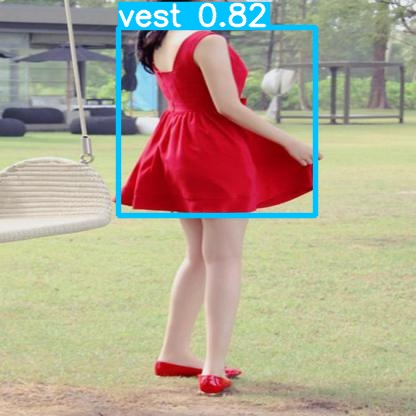

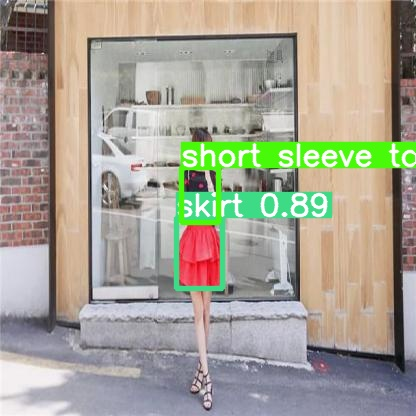

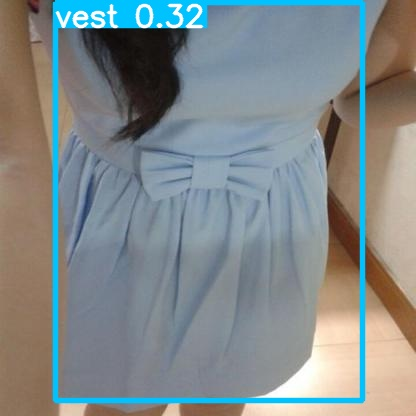

<br/>
/content/yolov5/runs/detect/exp/000024_jpg.rf.0107dc23d9308ac158670a072bf2a5c6.jpg
<br/>
/content/yolov5/runs/detect/exp/000145_jpg.rf.7b837533a45e28ed8276b1393e4f2a8c.jpg
<br/>
/content/yolov5/runs/detect/exp/000786_jpg.rf.b63563bcd104826bd7a08dab9e61697e.jpg


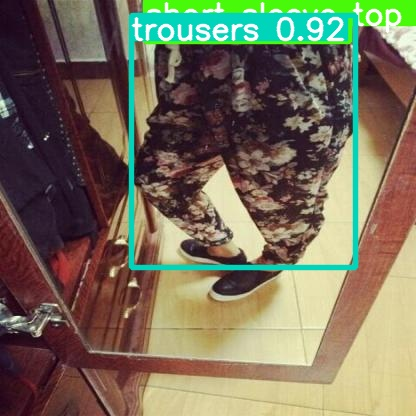

<br/>
/content/yolov5/runs/detect/exp/000709_jpg.rf.7ef17bfadf3b72bb220dac855d12ed83.jpg


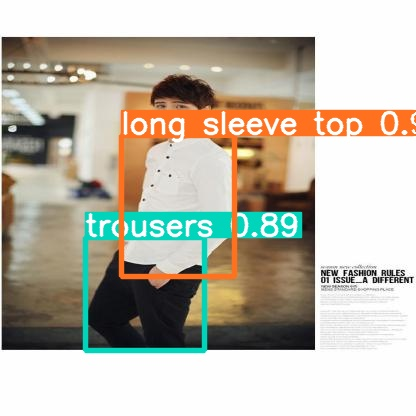

<br/>
/content/yolov5/runs/detect/exp/000991_jpg.rf.3702416aeeba714f92d9bdbf68a72f30.jpg


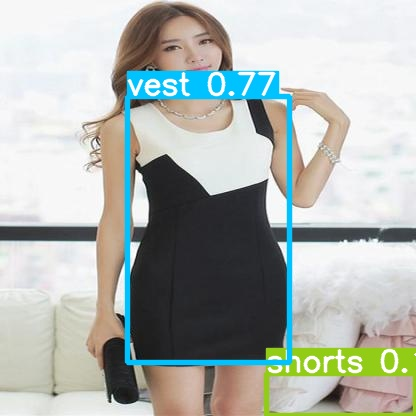

<br/>
/content/yolov5/runs/detect/exp/000071_jpg.rf.ab79eb27bbef8f49fe8824dbaa21f419.jpg


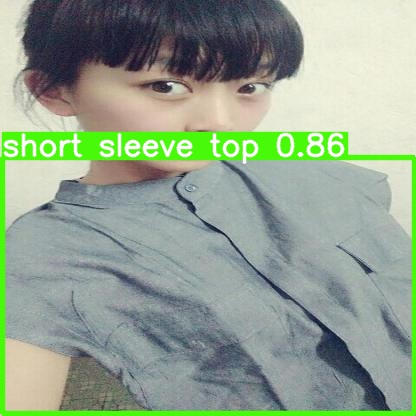

<br/>
/content/yolov5/runs/detect/exp/000498_jpg.rf.cdbbf5fac87360dc4aa3817e6e8807bf.jpg


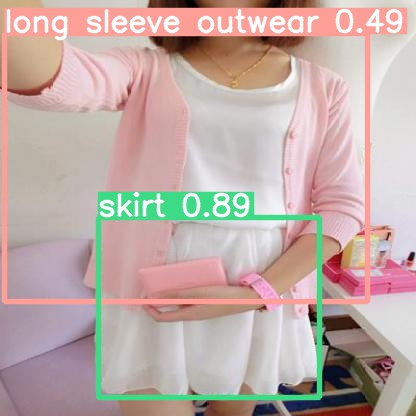

<br/>
/content/yolov5/runs/detect/exp/000538_jpg.rf.ee6db0350f3d9281f74a638d3295dee1.jpg


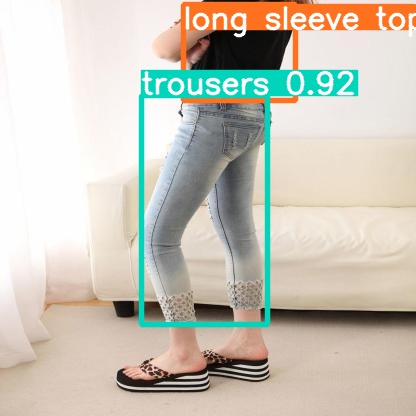

<br/>
/content/yolov5/runs/detect/exp/000984_jpg.rf.5a7e82fe41c660fb6d6c497371604754.jpg


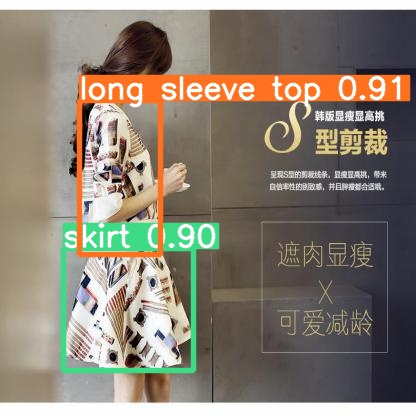

<br/>
/content/yolov5/runs/detect/exp/000655_jpg.rf.82720dc9587430a8bf3942d3137f72ae.jpg


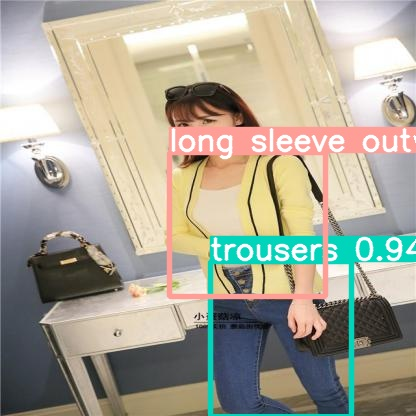

<br/>
/content/yolov5/runs/detect/exp/000128_jpg.rf.bfc1a82d8970adab83b108b8654419e5.jpg


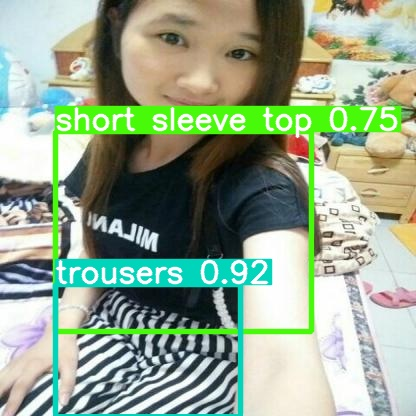

<br/>
/content/yolov5/runs/detect/exp/000816_jpg.rf.d063cb8dbbb5eeb3dbfa9f9a7a633189.jpg


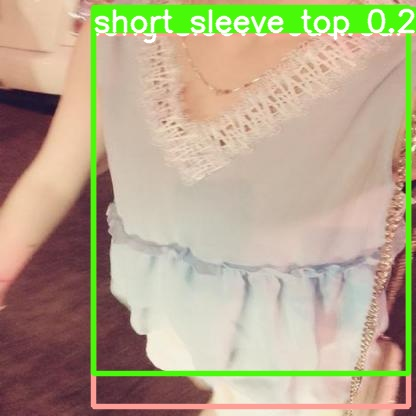

<br/>
/content/yolov5/runs/detect/exp/000321_jpg.rf.f0c547ac1c35eb68d492946a53dee5dc.jpg


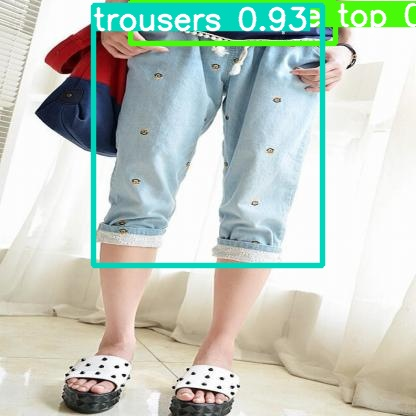

<br/>
/content/yolov5/runs/detect/exp/000892_jpg.rf.5a2a8d52822b3983e671866c8b7e7fb9.jpg


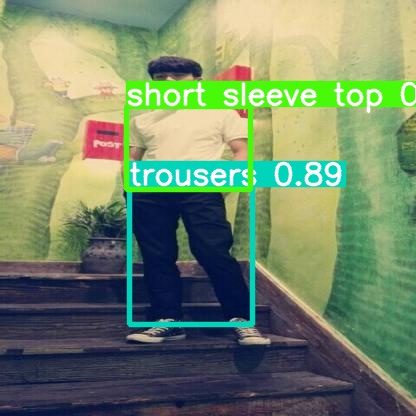

<br/>
/content/yolov5/runs/detect/exp/000843_jpg.rf.60b0b12d8a665a1caabc2e4d006f8741.jpg


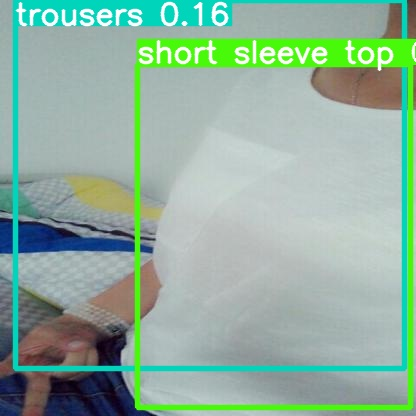

<br/>
/content/yolov5/runs/detect/exp/000292_jpg.rf.b77c0c451cbed4d1d0be9905ab9983b9.jpg


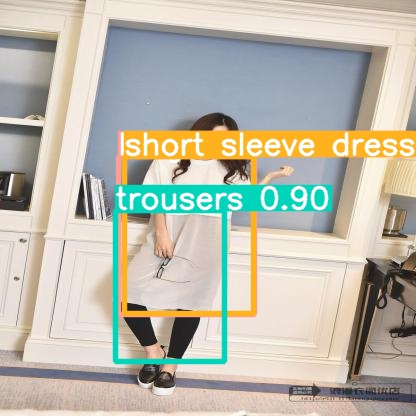

<br/>
/content/yolov5/runs/detect/exp/000835_jpg.rf.4b1b32f776fc08b4fb1a8dd9ebeb9b4e.jpg


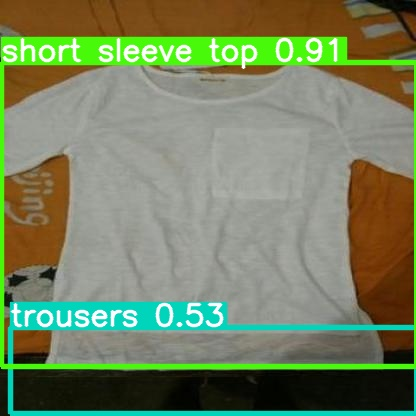

<br/>
/content/yolov5/runs/detect/exp/000091_jpg.rf.f92dcf5c3f93a5a28386e583120dcf18.jpg


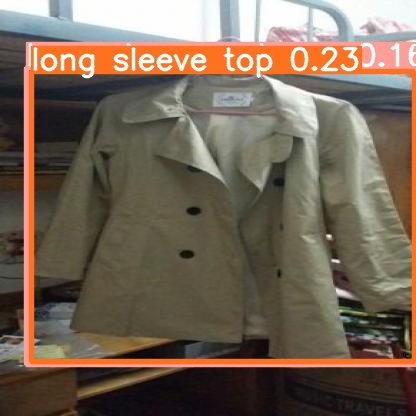

<br/>
/content/yolov5/runs/detect/exp/000133_jpg.rf.93d563d7f99b0e133ca09d8cdebbe906.jpg


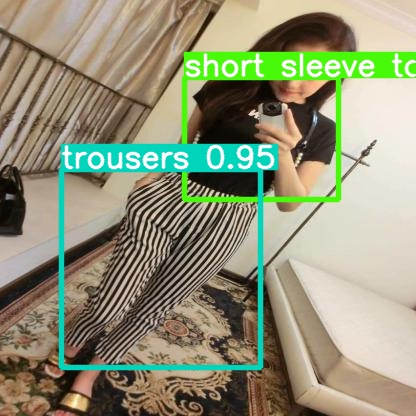

<br/>
/content/yolov5/runs/detect/exp/000977_jpg.rf.785e6444352a6d702949b9ad76533b83.jpg


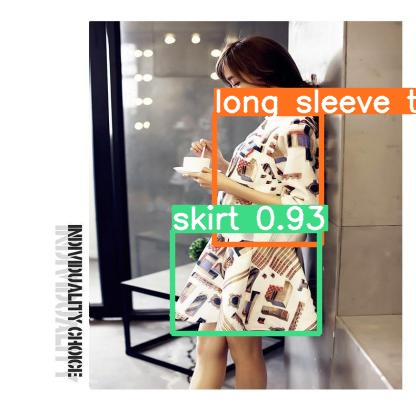

<br/>
/content/yolov5/runs/detect/exp/000282_jpg.rf.e7c7dacd5b37fede60d7adb9af354b71.jpg


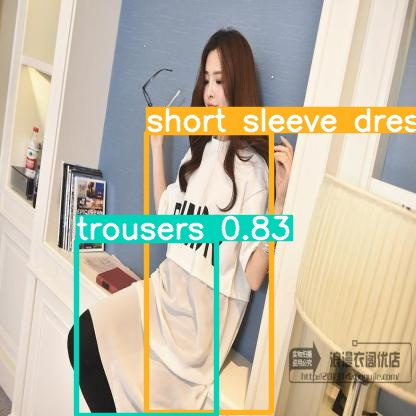

<br/>
/content/yolov5/runs/detect/exp/000211_jpg.rf.b24acba3b7b2ecab7edc5b61dabcb0c5.jpg


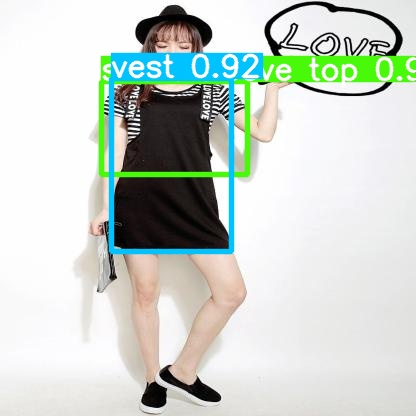

<br/>
/content/yolov5/runs/detect/exp/000097_jpg.rf.f8b612b4bf57ccd97df69e87fbf32ad4.jpg


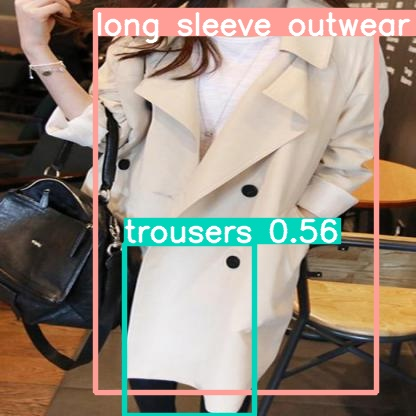

<br/>
/content/yolov5/runs/detect/exp/000229_jpg.rf.de5e746c56634dd54d10981907880d6b.jpg


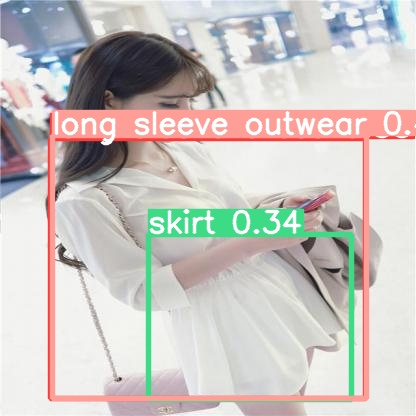

<br/>
/content/yolov5/runs/detect/exp/000200_jpg.rf.a7da2030ce8236570c954c582cc09647.jpg


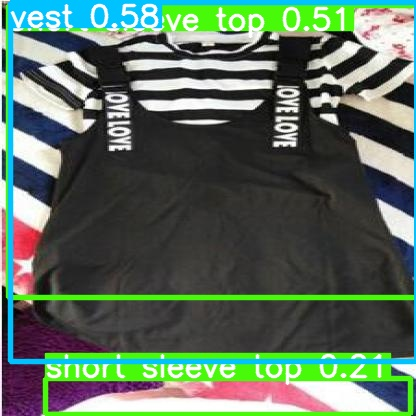

<br/>
/content/yolov5/runs/detect/exp/000898_jpg.rf.5dff5161917ff2252db5b7e584129f6f.jpg


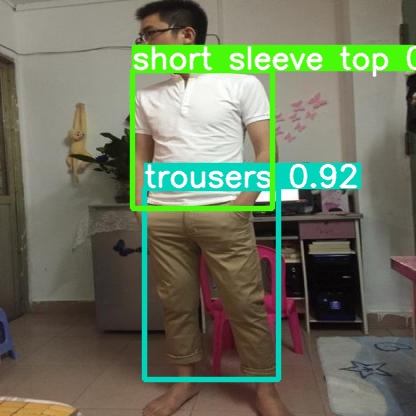

<br/>
/content/yolov5/runs/detect/exp/000613_jpg.rf.e75f635114514b03094e852e394f2598.jpg


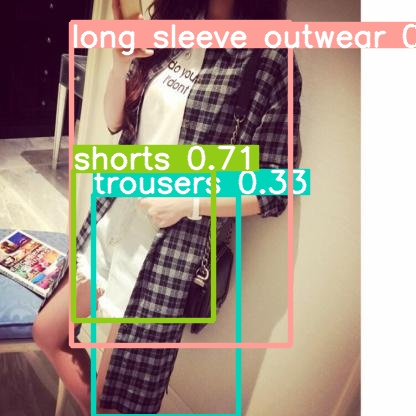

<br/>
/content/yolov5/runs/detect/exp/000948_jpg.rf.d9c99b1a417f65ba9169683f692a2eb6.jpg


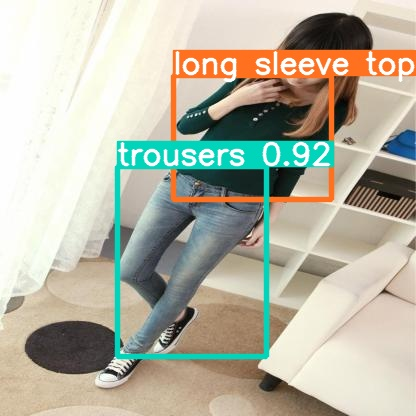

<br/>
/content/yolov5/runs/detect/exp/000342_jpg.rf.43f49b38ecb3f7856cedb85c322387d6.jpg


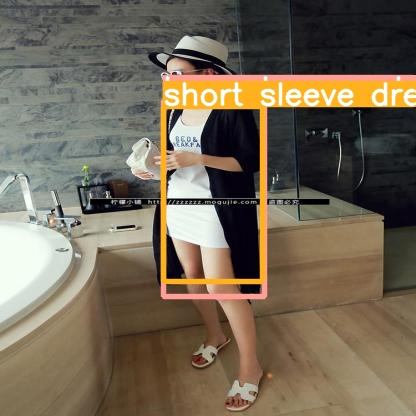

<br/>
/content/yolov5/runs/detect/exp/000988_jpg.rf.ac78200a5d1f0b38fe252cf860557291.jpg


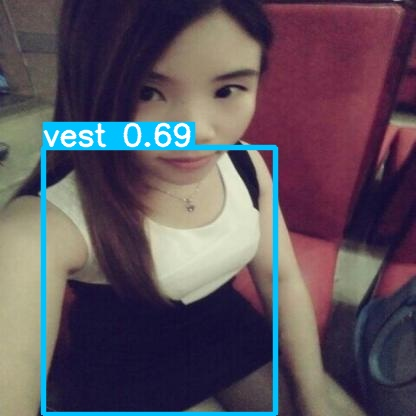

<br/>
/content/yolov5/runs/detect/exp/000791_jpg.rf.c0e36e74f01b13624aba6c5519aab760.jpg


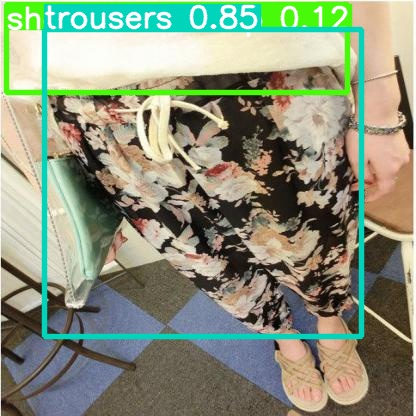

<br/>
/content/yolov5/runs/detect/exp/000507_jpg.rf.608fe32867e4721bc6a6b1b3ac5bc6f8.jpg


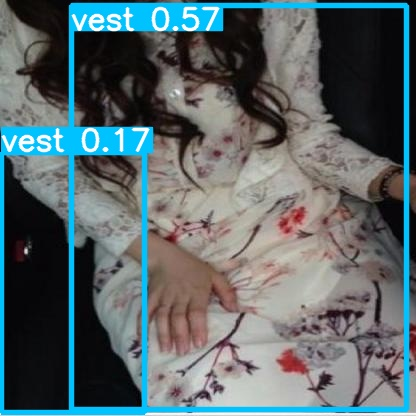

<br/>
/content/yolov5/runs/detect/exp/000045_jpg.rf.fb2cdc345987ac6c17858dc0cbc2ef6e.jpg


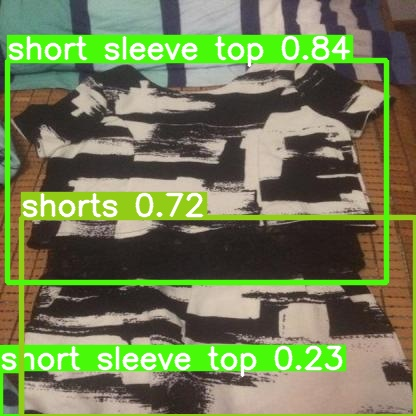

<br/>
/content/yolov5/runs/detect/exp/000095_jpg.rf.2fe012a04f5c8b5191cb9b38664c1404.jpg


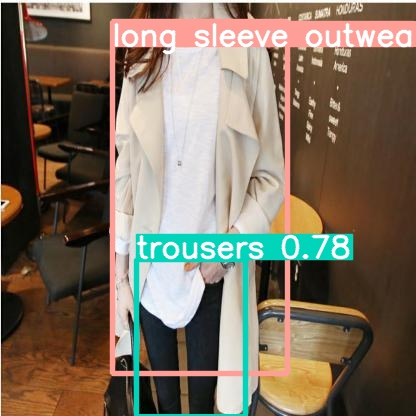

<br/>
/content/yolov5/runs/detect/exp/000862_jpg.rf.b0951d52be5c0c3bc7e7d07f89030b24.jpg


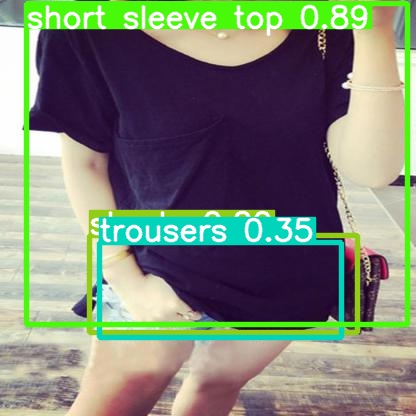

<br/>
/content/yolov5/runs/detect/exp/000834_jpg.rf.4d049a6671553b98d8505c537c13834b.jpg


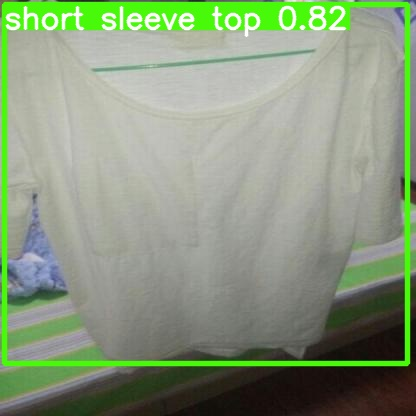

<br/>
/content/yolov5/runs/detect/exp/000069_jpg.rf.1d77de24805ea70314a938e8244bcac8.jpg


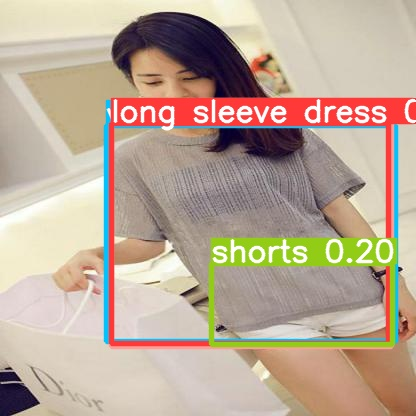

<br/>
/content/yolov5/runs/detect/exp/000237_jpg.rf.730ca4a7721ffa056a00faa4ba5a1e76.jpg


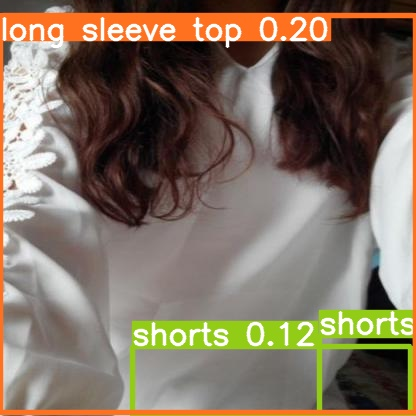

<br/>
/content/yolov5/runs/detect/exp/000244_jpg.rf.624e9891ee8644597646d895301111d9.jpg


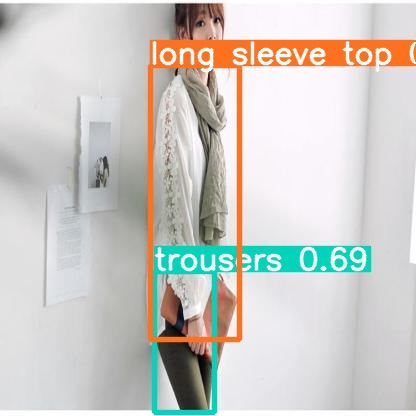

<br/>
/content/yolov5/runs/detect/exp/000502_jpg.rf.dbc6f94ea1625ff3d5f46db4ce101267.jpg


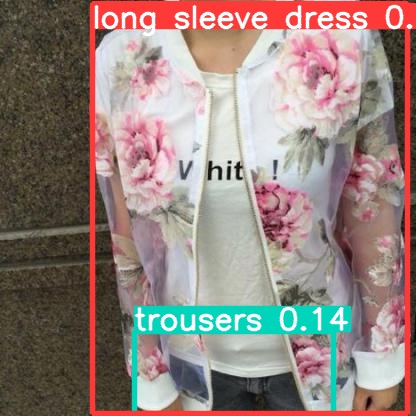

<br/>
/content/yolov5/runs/detect/exp/000390_jpg.rf.0a454d62459ea2fcac01a73ccb629694.jpg


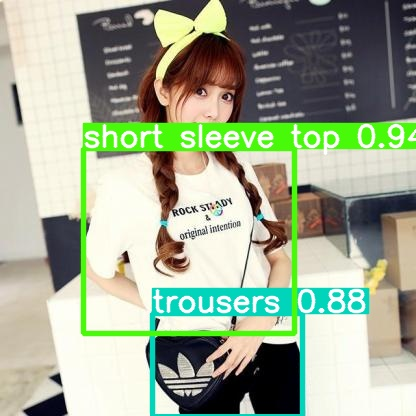

<br/>
/content/yolov5/runs/detect/exp/000293_jpg.rf.97a5cd42f9d406655ac2e0e6d8b675e4.jpg


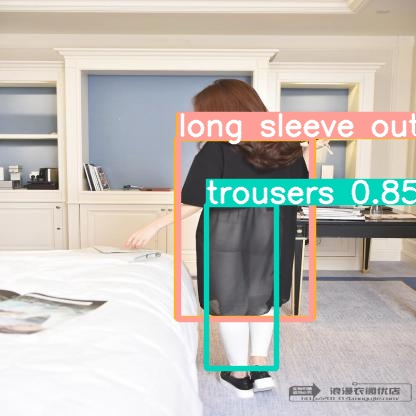

<br/>
/content/yolov5/runs/detect/exp/000611_jpg.rf.b56026ebb84ed41f1ae853478e071786.jpg


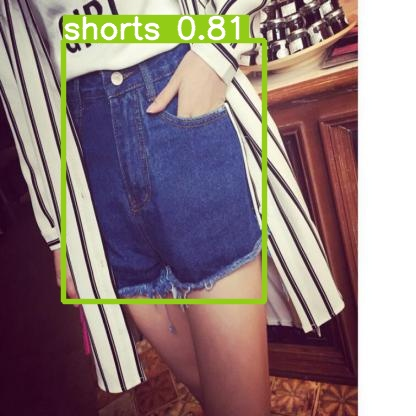

<br/>
/content/yolov5/runs/detect/exp/000147_jpg.rf.f1e3427d0ef6dd47f0ba2bb726885634.jpg


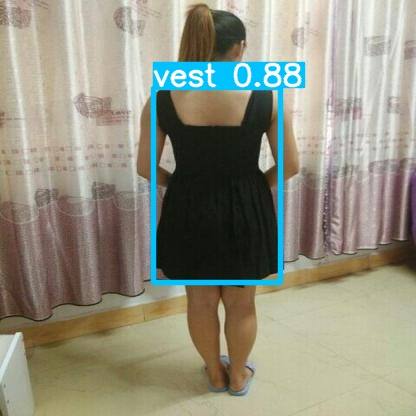

<br/>
/content/yolov5/runs/detect/exp/000384_jpg.rf.964c26f936ab911bd08159ed4506c8ab.jpg


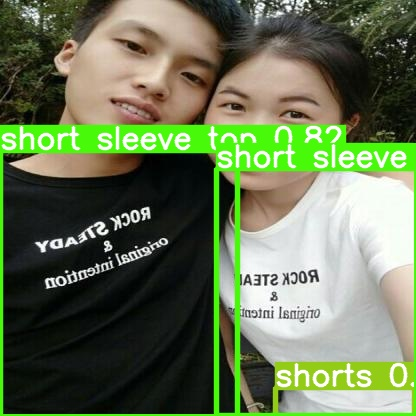

<br/>
/content/yolov5/runs/detect/exp/000821_jpg.rf.ccf834131e2c70f69bf358c99ee4f02f.jpg


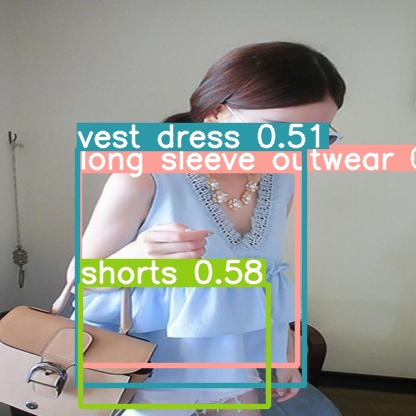

<br/>
/content/yolov5/runs/detect/exp/000808_jpg.rf.b232e9acd67b40a47bbaa02b432e6997.jpg


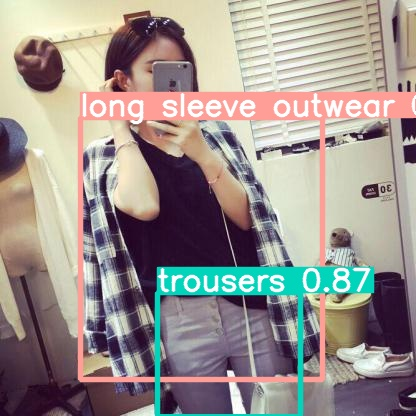

<br/>
/content/yolov5/runs/detect/exp/000461_jpg.rf.89e3b29b84c8e93b72c4091bde10ffed.jpg


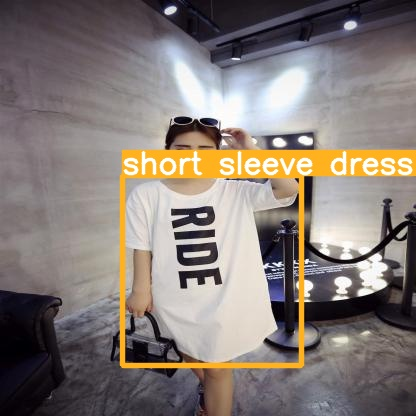

<br/>
/content/yolov5/runs/detect/exp/000451_jpg.rf.60319deb6127d87d7d4881fca81e6ce9.jpg


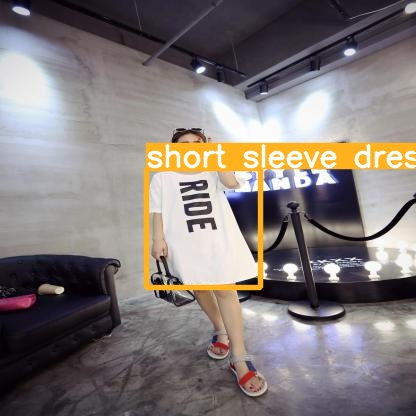

<br/>
/content/yolov5/runs/detect/exp/000542_jpg.rf.fc9e1e8e848850a57614fcfd26f196b1.jpg


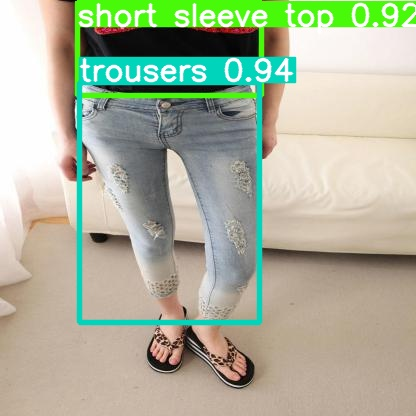

<br/>
/content/yolov5/runs/detect/exp/000941_jpg.rf.a05c659db5c2611e6790fcc1f7ae6f0e.jpg


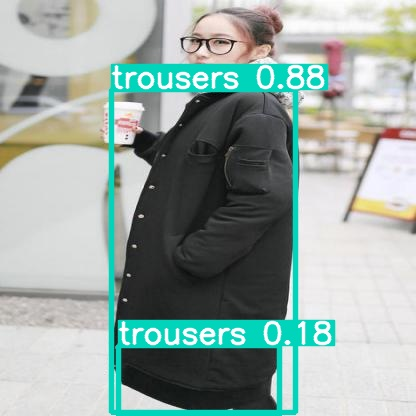

<br/>
/content/yolov5/runs/detect/exp/000950_jpg.rf.5ebb8622bd7779d90d6a16391a205a2e.jpg


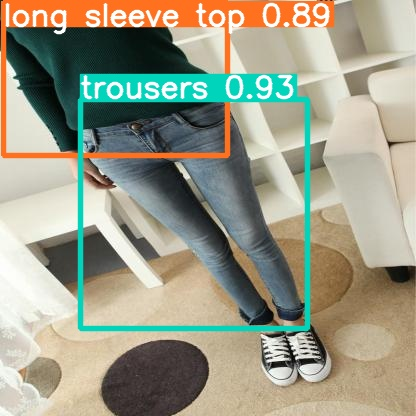

<br/>
/content/yolov5/runs/detect/exp/000046_jpg.rf.f79df616f34822d5c8303fe71fc4a226.jpg


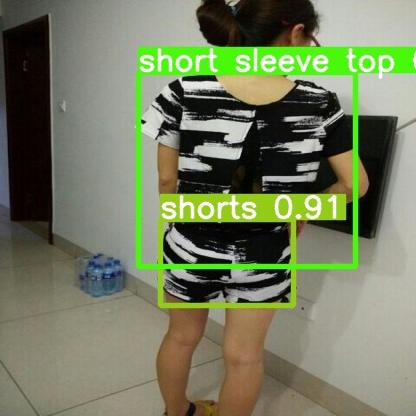

<br/>
/content/yolov5/runs/detect/exp/000015_jpg.rf.84564ef426b3f0ea3b4866f379f6fe76.jpg


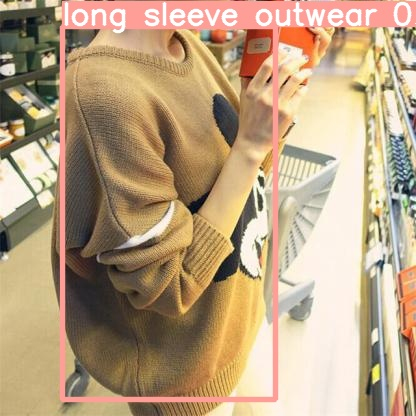

<br/>
/content/yolov5/runs/detect/exp/000706_jpg.rf.78915db872776b98dfcf78616cc23397.jpg


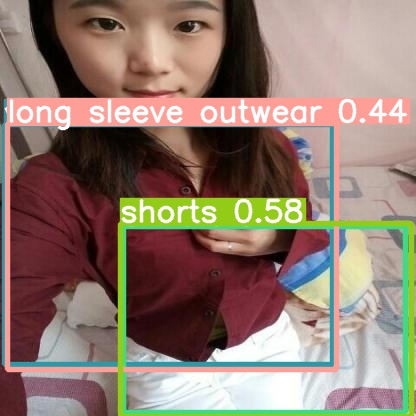

<br/>
/content/yolov5/runs/detect/exp/000381_jpg.rf.9c3c2720f4ce88354037ce297e317872.jpg


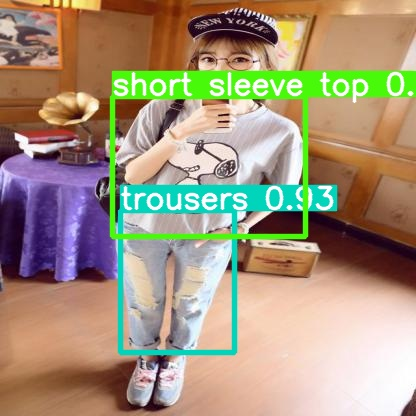

<br/>
/content/yolov5/runs/detect/exp/000960_jpg.rf.b24ee51b00119c23eaeaad23231d557c.jpg


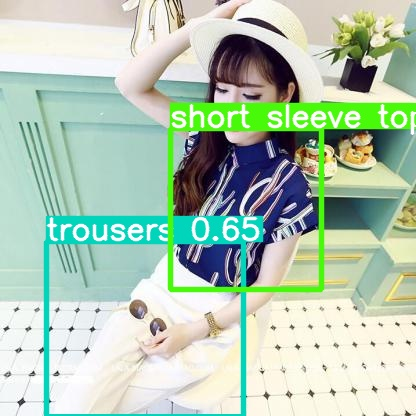

<br/>
/content/yolov5/runs/detect/exp/000796_jpg.rf.195ed8075f4ccd7f8bfa96d48993c61e.jpg


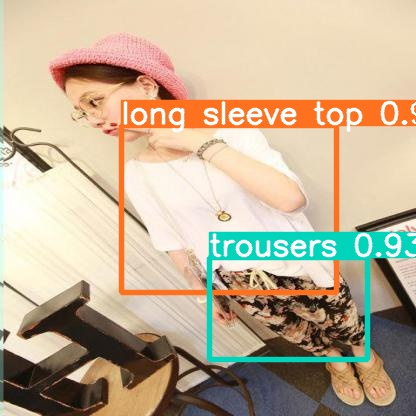

<br/>
/content/yolov5/runs/detect/exp/000586_jpg.rf.36bf77bf305ab71c1c215a177c5e0e85.jpg


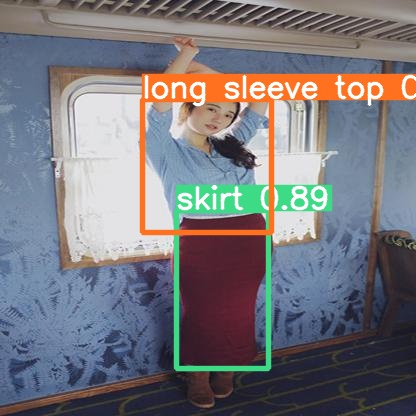

<br/>
/content/yolov5/runs/detect/exp/000405_jpg.rf.e79cdedc2d0089629ff44138f02f928c.jpg


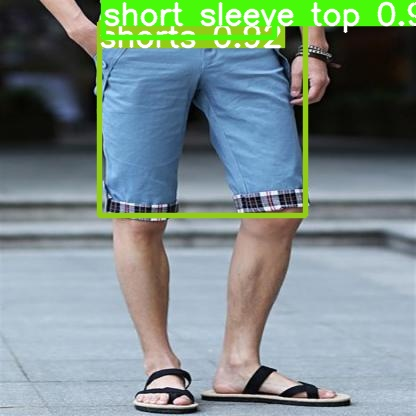

<br/>
/content/yolov5/runs/detect/exp/000216_jpg.rf.0c1879f8387a69b37e537e25e5843bb4.jpg


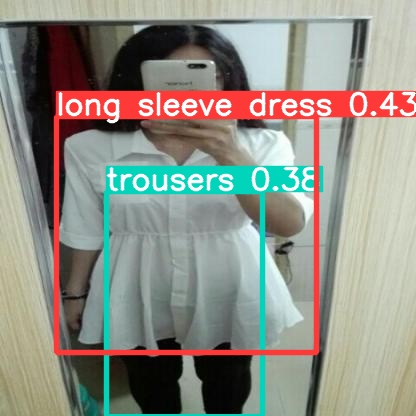

<br/>
/content/yolov5/runs/detect/exp/000780_jpg.rf.4c8cac4b46a932fededa01396365e61f.jpg


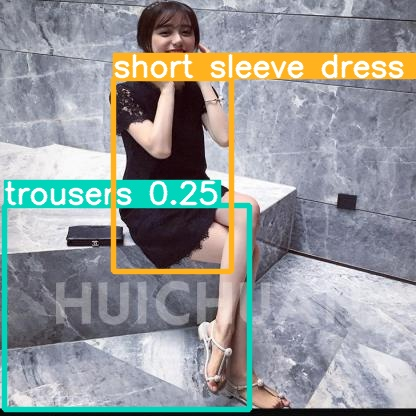

<br/>
/content/yolov5/runs/detect/exp/000726_jpg.rf.aa8e424d71fd1e9bb2924d7a70922700.jpg


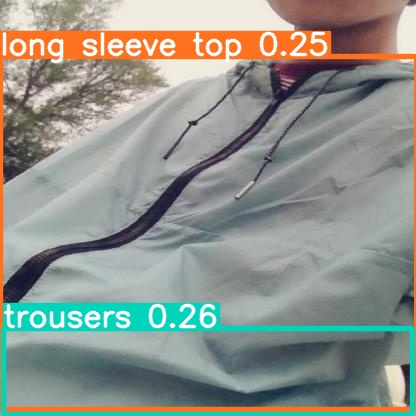

<br/>
/content/yolov5/runs/detect/exp/000020_jpg.rf.4dd944c5ab1614131bf7e84c3dea6676.jpg


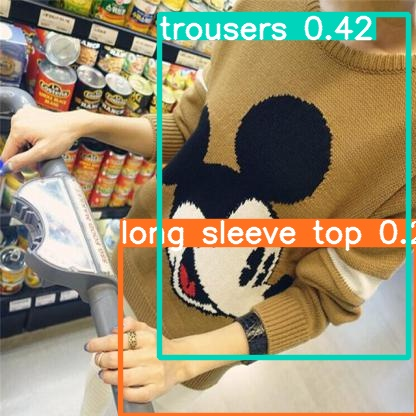

<br/>
/content/yolov5/runs/detect/exp/000588_jpg.rf.eec59670121cb9254781437a2f31b78b.jpg


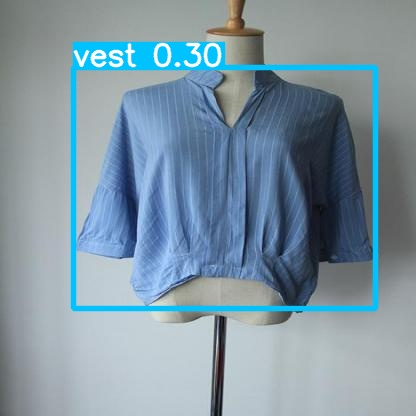

<br/>
/content/yolov5/runs/detect/exp/000900_jpg.rf.cb20891bd29488f1219915bd39735aaa.jpg


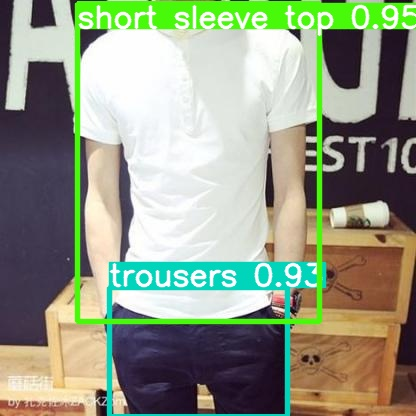

<br/>
/content/yolov5/runs/detect/exp/000192_jpg.rf.257232c4283611c7ca01636ea75bfdd2.jpg


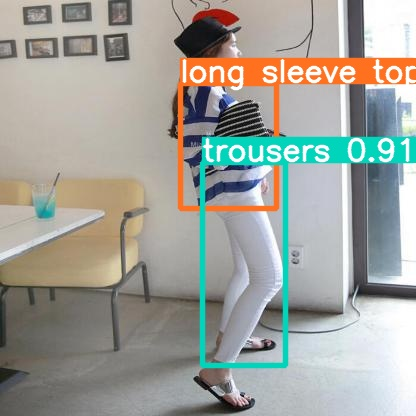

<br/>
/content/yolov5/runs/detect/exp/000828_jpg.rf.6f341fa69817519d16c5a7dcbe0c32bd.jpg


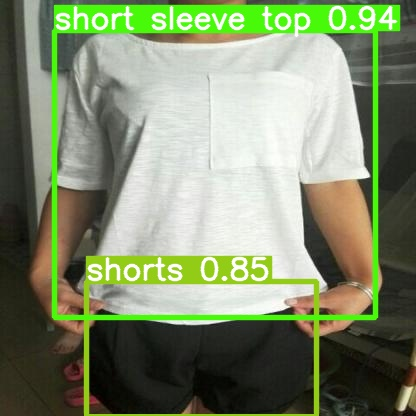

<br/>
/content/yolov5/runs/detect/exp/000572_jpg.rf.0f7216045bebcf424764f225492e958b.jpg


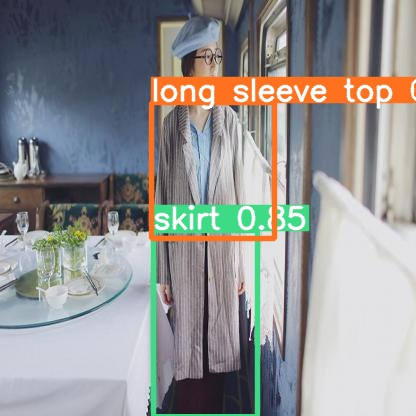

<br/>
/content/yolov5/runs/detect/exp/000705_jpg.rf.7044f90d2e9301917d0b28b05be042f8.jpg


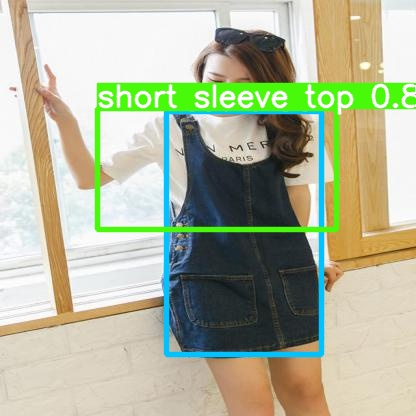

<br/>
/content/yolov5/runs/detect/exp/000608_jpg.rf.4d4c885f041c6317972e37e2345f91ef.jpg


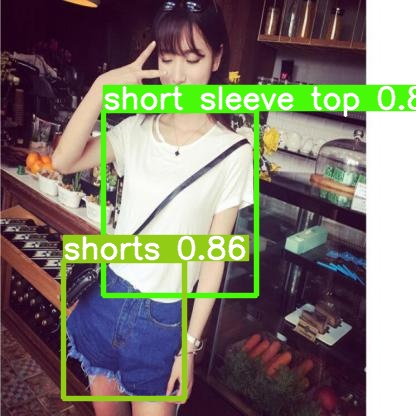

<br/>
/content/yolov5/runs/detect/exp/000790_jpg.rf.be4ac28dd5915eb52654fd875c964e98.jpg


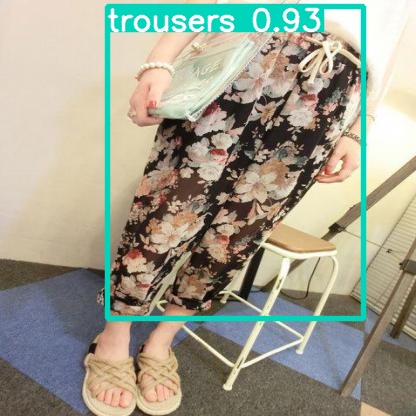

<br/>
/content/yolov5/runs/detect/exp/000525_jpg.rf.daa7c69ea4018b3c2ab24ac03b2a8c6e.jpg


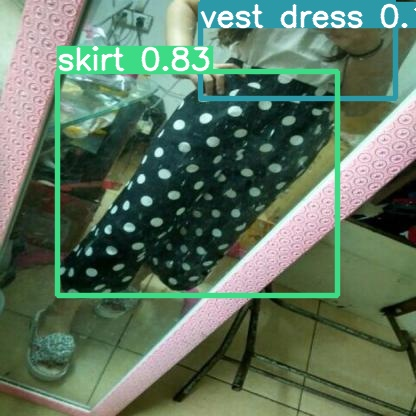

<br/>
/content/yolov5/runs/detect/exp/000031_jpg.rf.366e6f93bc7fd220deab5fa71b1d4a0d.jpg


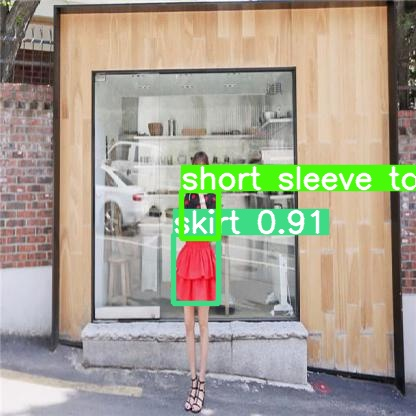

<br/>
/content/yolov5/runs/detect/exp/000765_jpg.rf.59e1fc7caec813d49de2638188bc842a.jpg


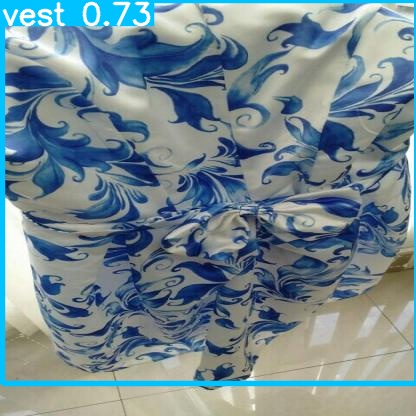

<br/>
/content/yolov5/runs/detect/exp/000585_jpg.rf.b9513c4bed2a330a317556c804e59c1f.jpg


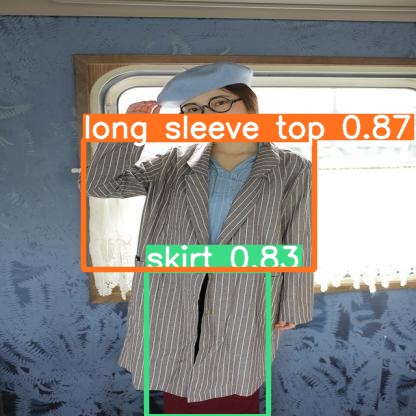

<br/>
/content/yolov5/runs/detect/exp/000313_jpg.rf.77c2e5c966f5b94d913effe37659693e.jpg


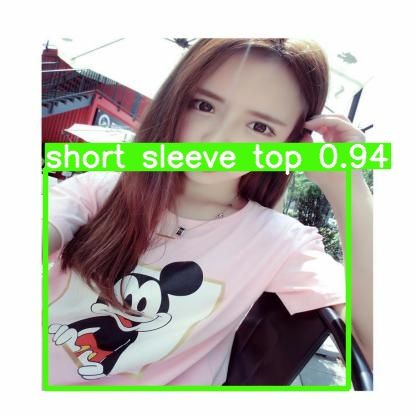

<br/>
/content/yolov5/runs/detect/exp/000883_jpg.rf.ba45c00235d76f8c68cbfef184f49c73.jpg


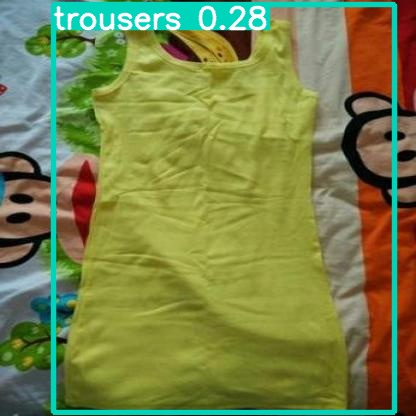

<br/>
/content/yolov5/runs/detect/exp/000174_jpg.rf.039e015b4573ec2952795109c4d682dd.jpg


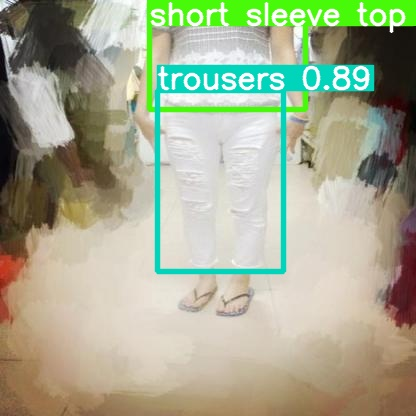

<br/>
/content/yolov5/runs/detect/exp/000949_jpg.rf.40a0a7613dea3fa9b3960e30f3176d07.jpg


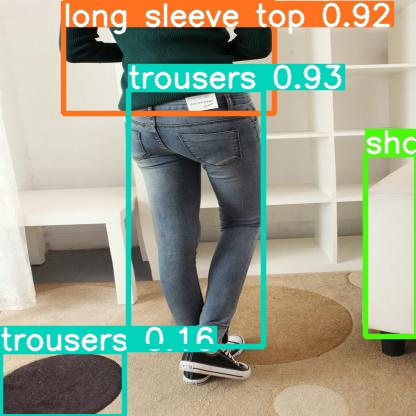

<br/>
/content/yolov5/runs/detect/exp/000887_jpg.rf.95f56ee3e7277878836fcd18d20d753c.jpg


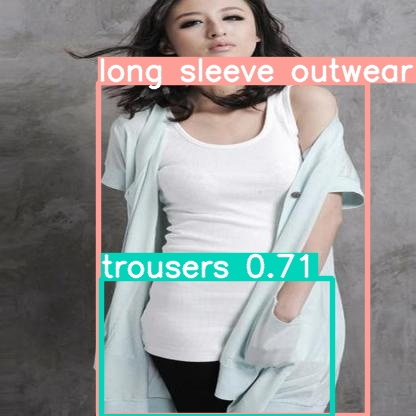

<br/>
/content/yolov5/runs/detect/exp/000820_jpg.rf.b5023893093763dccf58e265b59fd3e7.jpg


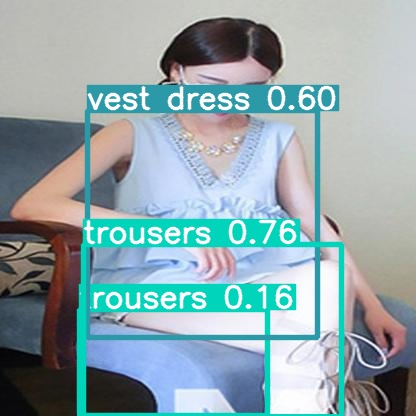

<br/>
/content/yolov5/runs/detect/exp/000528_jpg.rf.cd4c09fbff237aa0f1fc0a187cd0a601.jpg


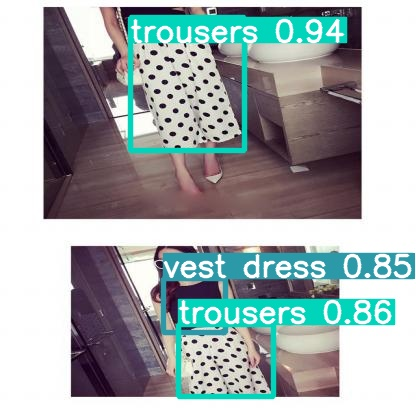

<br/>
/content/yolov5/runs/detect/exp/000453_jpg.rf.b02f1c4652ad0b3f0a33baa8a91d10ef.jpg


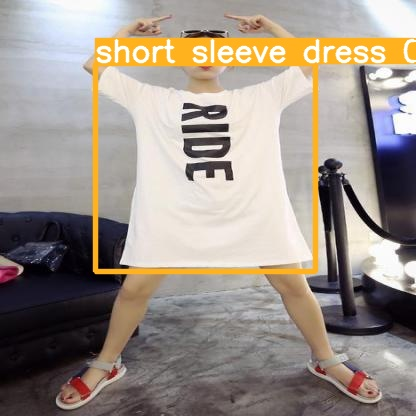

<br/>
/content/yolov5/runs/detect/exp/000176_jpg.rf.ccb2a4f85dac0b14678eeb19cfc6802b.jpg


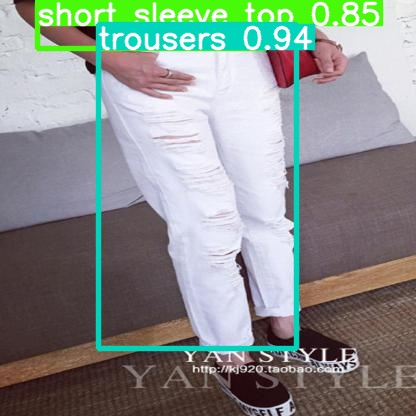

<br/>
/content/yolov5/runs/detect/exp/000271_jpg.rf.1d1d73d66fa5226fc253b785db2c2527.jpg


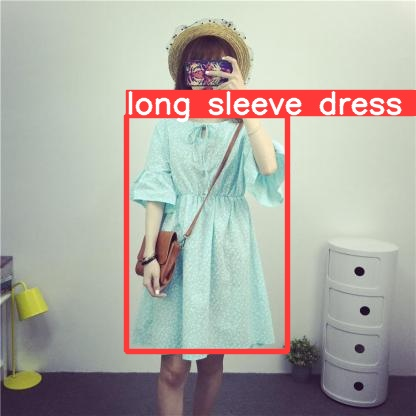

<br/>
/content/yolov5/runs/detect/exp/000797_jpg.rf.6e2d45fdf5a1ebb30e1ccc5cae0a7857.jpg


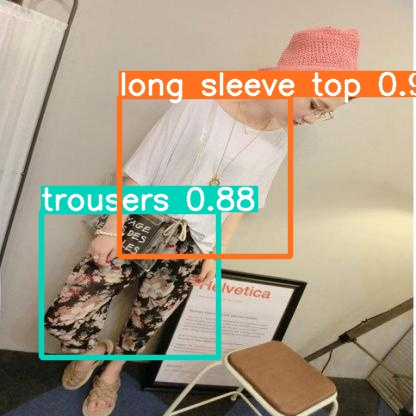

<br/>
/content/yolov5/runs/detect/exp/000624_jpg.rf.0c1a80c66e0784edac3aa75b39cef0a4.jpg


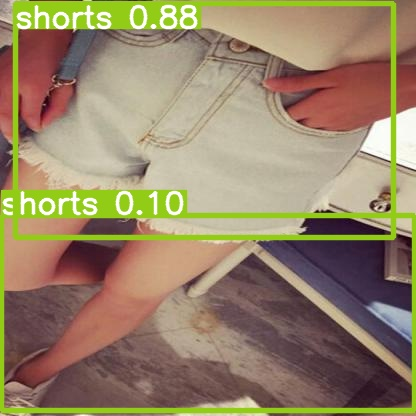

<br/>
/content/yolov5/runs/detect/exp/000061_jpg.rf.af948541cbec7f60a378deb056fe507d.jpg


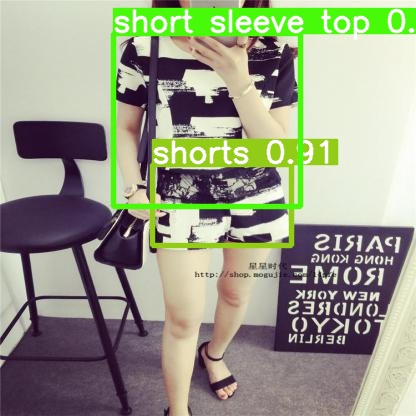

<br/>


In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
  print(imageName)
  display(Image(filename=imageName))
  print("<br/>")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import drive
drive.mount('/content/drive')

!cp runs/train/yolov5x_clothing/weights/best.pt /content/drive/Shareddrives/DATA-255/DeepFashion2/Trained_Weights/


#from google.colab import files
#files.download('./runs/train/exp/weights/best.pt')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
